In [10]:
%load_ext autoreload
%autoreload 2
import numpy as np
import random 
import tensorflow as tf
from matplotlib import pylab as plt
import matplotlib as mpl

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
def seed(num=123):
    random.seed(num + 123)
    np.random.seed(num + 456)
    tf.random.set_seed(num + 789)

## Linear model : weight direction and bias

In [12]:
from weight import simulation, learn, utils, config
Config = config.Config
x_span = config.Config.x_span
y_span = config.Config.y_span

# checkpoint at each milestone epoch
milestones = [1, 50, 100, 150, 200, 300, 400] 

In [13]:
class Experiment:
    def __init__(self, X, y, verbose=0, lr=0.1, l2=0):
        self.X = X
        self.y = y
        self.lr = lr #1 / np.linalg.svd(X)[1][0]
        self.l2 = l2
        self.verbose = verbose
    
    def class_exp(self, pos, neg, milestone, use_deep=True):
        sample_weight = learn.make_class_weight(self.y, pos, neg)
        return self.sample_exp(sample_weight, milestone, use_deep)
        
    def sample_exp(self, sample_weight, milestone, use_deep=True):
        curve = learn.run_linear(self.X, self.y, sample_weight, 
                                l2=self.l2, 
                                lr=self.lr, 
                                milestones=milestones, 
                                verbose=self.verbose)
        if use_deep:
            model, weights = learn.run_non_linear(X, y, sample_weight, 
                                                    l2=self.l2, 
                                                    lr=self.lr,  
                                                    milestones=milestone, 
                                                    verbose=self.verbose)
        else:
            model, weights = None, None
        return curve, (model, weights)

In [31]:
# generate linear seperable data
X, y = simulation.lin_sep()
margin = learn.get_margin(X, y)
lin_exp = Experiment(X, y)

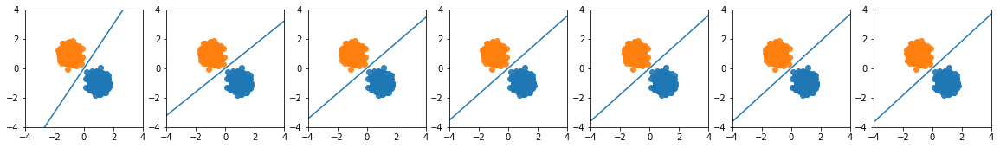

In [32]:
curve, (model, model_weight) = lin_exp.class_exp(0.5, 0.5, milestones)
#deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=None)

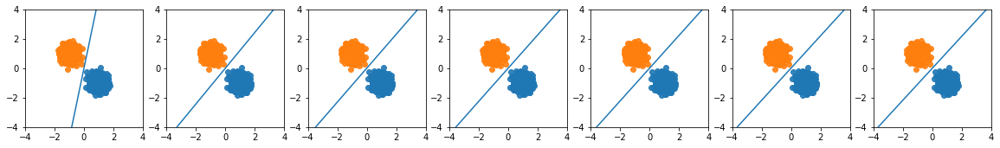

In [33]:
curve, (model, model_weight) = lin_exp.class_exp(0.1, 0.9, milestones, use_deep=False)
#deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=None)

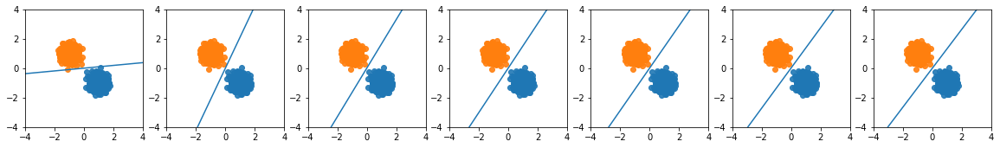

In [34]:
curve, (model, model_weight) = lin_exp.class_exp(0.9, 0.1, milestones, use_deep=False)
# deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=None)


In [57]:
seed()
X, y = simulation.non_lin_sep()
lin_exp = Experiment(X, y)

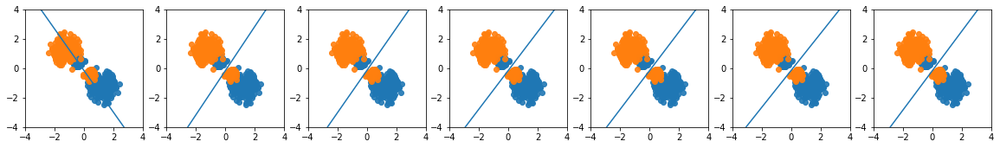

In [58]:
curve, (model, model_weight) = lin_exp.class_exp(1, 1, milestones, use_deep=False)
# deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=None)

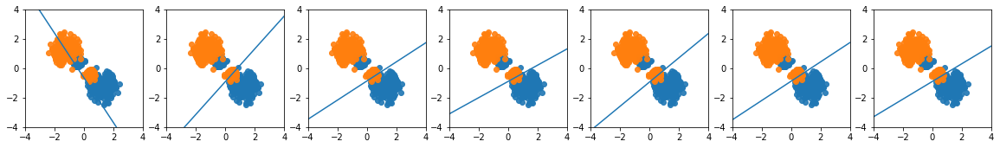

In [59]:
curve, (model, model_weight) = lin_exp.class_exp(10, 1, milestones, use_deep=False)
# deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=None)

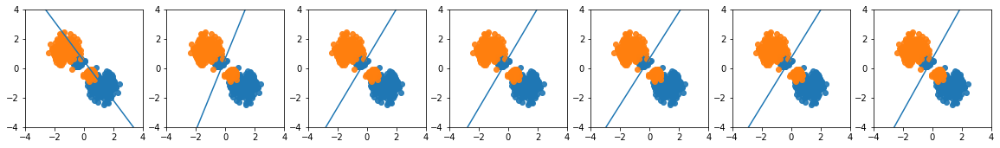

In [60]:
curve, (model, model_weight) = lin_exp.class_exp(1, 10, milestones, use_deep=False)
# deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=None)

In [76]:
seed()
X, y = simulation.non_lin_moon()
lin_exp = Experiment(X, y, lr=0.1)

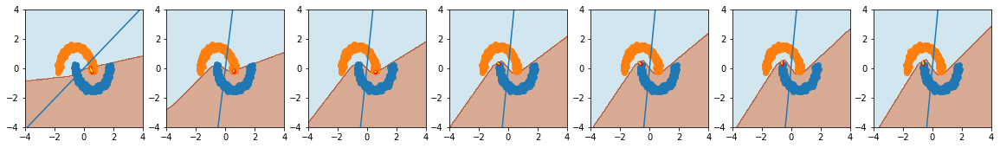

In [77]:
curve, (model, model_weight) = lin_exp.class_exp(0.5, 0.5, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

In [78]:
((model.predict(X) > 0)[:, 0] == y).mean()

1.0

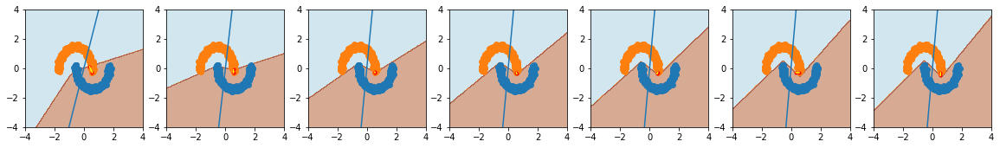

In [72]:
curve, (model, model_weight) = lin_exp.class_exp(0.9, 0.1, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

In [73]:
((model.predict(X) > 0)[:, 0] == y).mean()

1.0

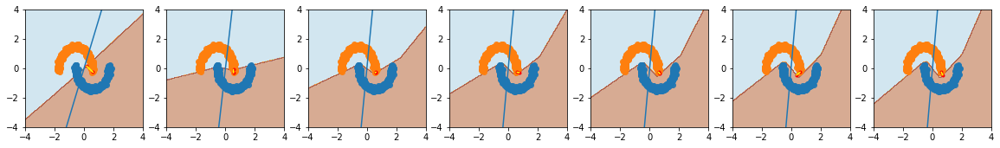

In [74]:
curve, (model, model_weight) = lin_exp.class_exp(0.1, 0.9, milestones)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

In [75]:
((model.predict(X) > 0)[:, 0] == y).mean()

1.0

# Linear model : Convergence speed
We measure the convergence speed by comparing the margins and directions between trained model and the optimal solutions gained from SVM with hard-margin since the data is linear separable.

In [280]:
# common milestones with increasing gap between epochs
def get_milestones(limit=400, gap_size=0.5):
    milestones = []
    step, gap = 1, 1
    while step < limit:
        milestones.append(step)
        gap += gap_size
        step += int(gap)
    return milestones
milestones = get_milestones()

## Linear separable data

In [182]:
# generate linear seperable data
seed(333)
sigmoid = lambda x: np.exp(x) / (1 + np.exp(x))
X, y = simulation.lin_sep()
xx, yy = np.meshgrid(x_span, y_span)
margin = learn.get_margin(X, y)
lin_exp = Experiment(X, y, lr=0.1, verbose=0)



from sklearn import svm
clf = svm.SVC(kernel='linear', C=1000)
clf.fit(X, y)
func_margins = 2 * (y - 0.5) * clf.decision_function(X)

sample_weight = sigmoid(func_margins)
optimal_dir = clf.coef_ / np.linalg.norm(clf.coef_)
assert(sum(func_margins < 0) == 0)
class_weights = [(1, 1), (1, 2), (2, 1)]

### With class specific weight

In [183]:
curve_cache = {}
for weight in class_weights:
    curve, (_, _) = lin_exp.class_exp(weight[0], weight[1], milestones, use_deep=False)
    curve_cache[weight] = curve

In [184]:
lin_margin_exp = {}
for weight in class_weights:
    margins = utils.get_linear_margin(X, y, xx, yy, curve_cache[weight])
    lin_margin_exp[weight] = margins

### with weight generated by SVM

In [185]:
from sklearn import svm
clf = svm.SVC(kernel='linear', C=1000)
clf.fit(X, y)
func_margins = 2 * (y - 0.5) * clf.decision_function(X)

sample_weight = np.exp(1/func_margins)
optimal_dir = clf.coef_ / np.linalg.norm(clf.coef_)
assert(sum(func_margins < 0) == 0)

* margin comparison

In [186]:
opt_svm_curves, (opt_svm_mlp, opt_svm_mlp_weights) = lin_exp.sample_exp(sample_weight, milestones, use_deep=True)
opt_svm_margins = utils.get_linear_margin(X, y, xx, yy, opt_svm_curves)

In [187]:
result = utils.preprocess_deep(X, y, x_span, y_span, opt_svm_mlp, opt_svm_mlp_weights)
opt_svm_mlp_margins = [x[1] for x in result]

&lt;matplotlib.legend.Legend at 0x7fd3f289bfd0&gt;

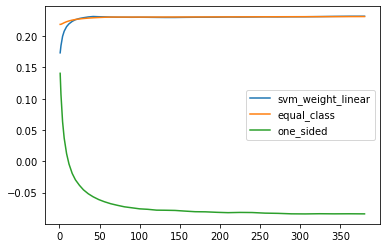

In [188]:
plt.plot(milestones, opt_svm_margins, label='svm_weight_linear')
#plt.plot(milestones, opt_svm_mlp_margins, label='svm_weight_mlp')
plt.plot(milestones, lin_margin_exp[(1, 1)], label='equal_class')
plt.plot(milestones, lin_margin_exp[(1, 2)], label='one_sided')

plt.legend()

* Angle comparison

In [189]:
lin_angle_exp = {}
for weight in class_weights:
     coefs_arr = np.array([x[0] for x in curve_cache[weight]])
     coefs_arr = np.squeeze(coefs_arr)
     coefs_arr = coefs_arr / np.linalg.norm(coefs_arr, axis=1)[:, np.newaxis]
     lin_angle_exp[weight] = coefs_arr.dot(optimal_dir.T)

opt_svm_arr = np.array([x[0] for x in opt_svm_curves])
opt_svm_arr = np.squeeze(opt_svm_arr)
opt_svm_arr = opt_svm_arr / np.linalg.norm(opt_svm_arr, axis=1)[:, np.newaxis]
opt_svp_angle = opt_svm_arr.dot(optimal_dir.T)

&lt;matplotlib.legend.Legend at 0x7fd45040af10&gt;

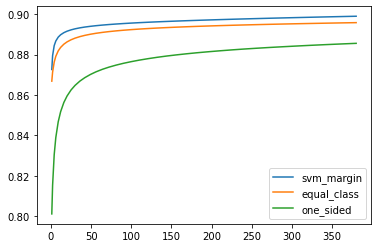

In [190]:
plt.plot(milestones,  opt_svp_angle, label='svm_margin')
plt.plot(milestones,  lin_angle_exp[(1, 1)], label='equal_class')
plt.plot(milestones,  lin_angle_exp[(1, 2)], label='one_sided')
plt.legend()

## Non linear separable data

In [347]:
milestones = get_milestones(1000, 5)

In [348]:
# generate linear seperable data
seed(333)
X, y = simulation.non_lin_moon()
xx, yy = np.meshgrid(x_span, y_span)
#margin = learn.get_margin(X, y)
nonlin_exp = Experiment(X, y, lr=0.1, verbose=0)

### With class specific weight

In [349]:
class_weights = [(0.5, 0.5), (1, 2)]
model_cache = {}
for weight in class_weights:
    curve, (model, weights) = nonlin_exp.class_exp(weight[0], weight[1], milestones, use_deep=True)
    model_cache[weight] = (model, weights)

In [350]:
lin_margin_exp = {}
for weight in class_weights:
    model, model_weights = model_cache[weight]
    result = utils.preprocess_deep(X, y, x_span, y_span, model, model_weights)
    lin_margin_exp[weight] = [x[1] for x in result]

&lt;matplotlib.legend.Legend at 0x7fd3d86cf160&gt;

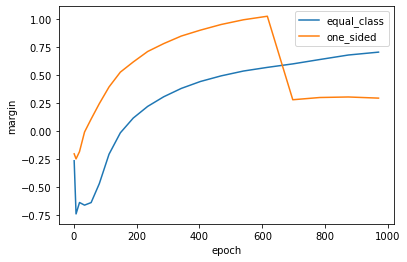

In [351]:
plt.plot(milestones, lin_margin_exp[(0.5, 0.5)], label='equal_class')
plt.plot(milestones, lin_margin_exp[(1, 2)], label='one_sided')
plt.ylabel('margin')
plt.xlabel('epoch')
plt.legend()

Text(0.5, 0, &#39;epoch&#39;)

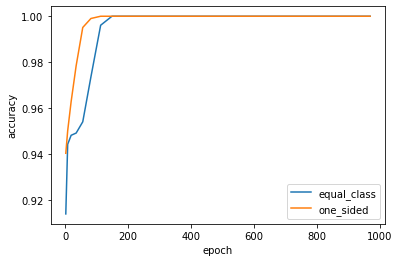

In [352]:
def get_acc(model, weights, x, y):
    acc = []
    for weight in weights:
        model.set_weights(weight)
        acc.append(((model.predict(x) > 0)[:, 0] == y).mean())
    return acc

key = (0.5, 0.5)
acc = get_acc( model_cache[key][0],  model_cache[key][1], X, y)
plt.plot(milestones, acc, label='equal_class')

key = (1, 2)
acc = get_acc( model_cache[key][0],  model_cache[key][1], X, y)
plt.plot(milestones, acc, label='one_sided')
plt.legend()
plt.ylabel('accuracy')
plt.xlabel('epoch')

### Generalization experiments on moon data

In [337]:
# generate linear seperable data
seed(333)
X, y = simulation.non_lin_moon(size=2048)
xx, yy = np.meshgrid(x_span, y_span)
#margin = learn.get_margin(X, y)
#nonlin_exp = Experiment(X, y, lr=0.1, verbose=0)

def shuffle_sample(x, y, ratio):
    index = np.arange(len(x))
    np.random.shuffle(index)
    x = x[index]
    y = y[index]

    train_size = int(len(x) * ratio)
    train_x = x[:train_size]
    train_y = y[:train_size]
    test_x = x[train_size:]
    test_y = y[train_size:]
    return (train_x, train_y), (test_x, test_y)

(pos_tr_x, pos_tr_y), (pos_te_x, pos_te_y) = shuffle_sample(X[y > 0], y[y > 0], 0.9)
(neg_tr_x, neg_tr_y), (neg_te_x, neg_te_y) = shuffle_sample(X[y == 0], y[y == 0], 0.1)

tr_x = np.concatenate([pos_tr_x, neg_tr_x], axis=0)
tr_y = np.concatenate([pos_tr_y, neg_tr_y], axis=0)
te_x = np.concatenate([pos_te_x, neg_te_x], axis=0)
te_y = np.concatenate([pos_te_y, neg_te_y], axis=0)

In [338]:
milestones = get_milestones(200, 2)

In [339]:
nonlin_exp = Experiment(X, y, lr=0.001, verbose=0)

In [340]:
 _, (model, model_weights) = nonlin_exp.class_exp(1, 1, milestones, use_deep=True)

In [341]:
 _, (w_model, w_model_weights) = nonlin_exp.class_exp(1, 9, milestones, use_deep=True)

In [344]:
 _, (w2_model, w2_model_weights) = nonlin_exp.class_exp(1/9, 9, milestones, use_deep=True)

In [345]:
acc = get_acc(model, model_weights, te_x, te_y)
w_acc = get_acc(w_model, w_model_weights, te_x, te_y)
w2_acc = get_acc(w2_model, w2_model_weights, te_x, te_y)

&lt;matplotlib.legend.Legend at 0x7fd3d8c15550&gt;

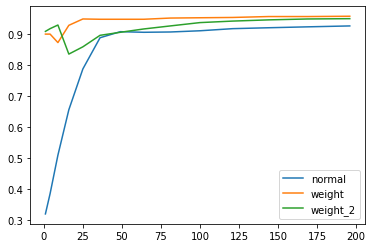

In [346]:
plt.plot(milestones, acc, label='normal')
plt.plot(milestones, w_acc, label='weight')
plt.plot(milestones, w2_acc, label='weight_2')
plt.legend()